# **EDA**

# **Checking Information of Dataset**

In [104]:
import pandas as pd
df = pd.read_csv('source.csv')

print(df.head())
print(df.info())
print(df.describe())

                       time  latitude  longitude  depth  mag magType  nst  \
0  2018-11-27T14:34:20.900Z   48.3780   154.9620  35.00  4.9      mb  NaN   
1  2018-11-26T23:33:50.630Z   36.0733   139.7830  48.82  4.8     mww  NaN   
2  2018-11-26T13:04:02.250Z   38.8576   141.8384  50.56  4.5      mb  NaN   
3  2018-11-26T05:20:16.440Z   50.0727   156.1420  66.34  4.6      mb  NaN   
4  2018-11-25T09:19:05.010Z   33.9500   134.4942  38.19  4.6      mb  NaN   

     gap   dmin   rms  ...                   updated  \
0   92.0  5.044  0.63  ...  2018-11-27T16:06:33.040Z   
1  113.0  1.359  1.13  ...  2018-11-27T16:44:22.223Z   
2  145.0  1.286  0.84  ...  2018-11-26T23:52:21.074Z   
3  128.0  3.191  0.62  ...  2018-11-26T08:13:58.040Z   
4  104.0  0.558  0.61  ...  2018-11-25T23:24:52.615Z   

                                  place        type horizontalError  \
0  269km SSW of Severo-Kuril'sk, Russia  earthquake             7.6   
1               3km SSW of Sakai, Japan  earthquake       

# **Convert to Datetime**

In [73]:
df['time'] = pd.to_datetime(df['time'], errors='coerce')
df['updated'] = pd.to_datetime(df['updated'], errors='coerce')

# **Handling Missing Earthquake Data in DataFrame**

In [100]:
# Insert checks and handling of missing values here
print("Total missing values:\n", df.isnull().sum())

original_len = len(df)

# drop rows if latitude, longitude, mag, or depth are missing
df.dropna(subset=['latitude', 'longitude', 'mag', 'depth'], inplace=True)

# Check how many rows remain after dropping
print(f"DataFrame length before dropna: {original_len}")
print(f"DataFrame length after dropna: {len(df)}")

Total missing values:
 time                   0
latitude               0
longitude              0
depth                  0
mag                    0
magType                0
nst                 3609
gap                  782
dmin               10485
rms                   78
net                    0
id                     0
updated                0
place                  0
type                   0
horizontalError    11292
depthError          5052
magError           10661
magNst              3044
status                 0
locationSource         0
magSource              0
dtype: int64
DataFrame length before dropna: 14092
DataFrame length after dropna: 14092


There was no missing value.

# **Visualizing Earthquake Magnitudes, Depths, Temporal Trends, and Epicenters**

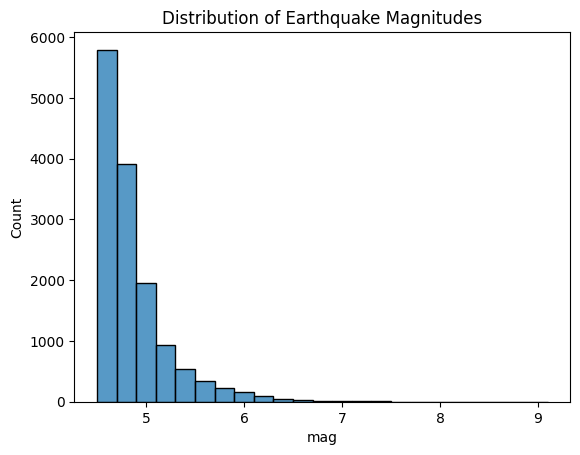

In [71]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.histplot(data=df, x='mag', binwidth=0.2)
plt.title('Distribution of Earthquake Magnitudes')
plt.show()

Most earthquakes have magnitudes between 4.0 and 5.0. As magnitude increases, the number of events drops sharply, showing a right-skewed distribution.

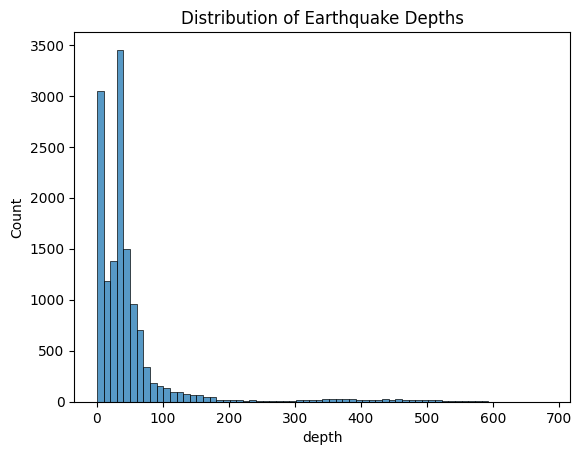

In [5]:
sns.histplot(data=df, x='depth', binwidth=10)
plt.title('Distribution of Earthquake Depths')
plt.show()

Most earthquakes occur at shallow depths, mainly between 0 and 100 km. Deeper earthquakes are much less frequent, showing a right-skewed distribution

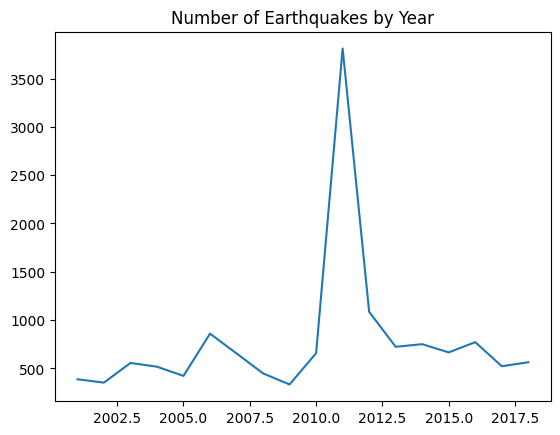

In [6]:
df['year'] = df['time'].dt.year
yearly_counts = df.groupby('year')['id'].count()
plt.plot(yearly_counts.index, yearly_counts.values)
plt.title('Number of Earthquakes by Year')
plt.show()

# **Scatterplot of Depth vs. Magnitude**

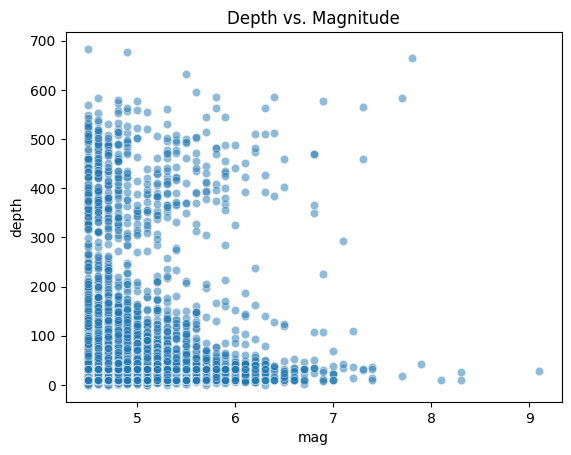

In [8]:
sns.scatterplot(data=df, x='mag', y='depth', alpha=0.5)
plt.title('Depth vs. Magnitude')
plt.show()

Most earthquakes occur at shallow depths. There is no clear correlation between depth and magnitude.

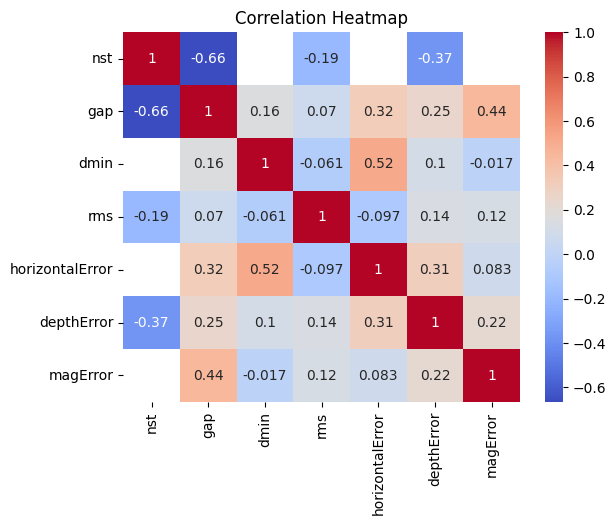

In [9]:
corr = df[['nst','gap','dmin','rms','horizontalError','depthError','magError']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

* There is a strong negative correlation between nst (number of stations) and gap (-0.66):
  * → When more stations are available, the azimuthal gap becomes smaller, indicating better coverage and likely higher data accuracy.
* nst also shows a moderate negative correlation with depthError (-0.37):
  * → More stations contribute to more accurate depth estimation. This suggests improving station density could reduce depth estimation error.
* gap is moderately positively correlated with magError (0.44):
  * → A larger azimuthal gap may lead to less accurate magnitude calculations, likely due to incomplete directional coverage.
* dmin (minimum distance to station) is positively correlated with horizontalError (0.52):
  * → The farther the station is from the epicenter, the more likely horizontal location error increases. This emphasizes the importance of having nearby sensors.
* magError is weakly positively correlated with several variables, such as nst (0.44), depthError (0.22), and horizontalError (0.083):
  * → While not extremely strong, it indicates that multiple observational factors can collectively influence magnitude accuracy.

# **Machine Learning**

# **Clustering of Earthquakes (Spatial Pattern Analysis)**

Cluster Centers (standardized):
    latitude  longitude     depth  cluster_id
0 -0.249139  -0.120414 -0.208154           0
1 -1.332342  -2.117011 -0.127855           1
2  1.363400   1.385884 -0.079107           2
3 -0.238750  -0.557242  4.626822           3

Cluster Means:
                latitude   longitude       depth
cluster_label                                   
0              35.764571  142.191454   35.419984
1              28.609327  129.109195   41.570978
2              46.416419  152.061141   45.305156
3              35.833199  139.329235  405.784451


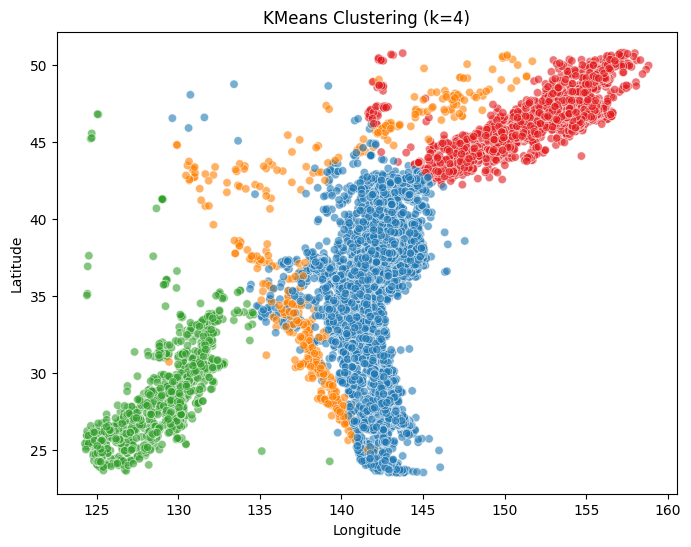

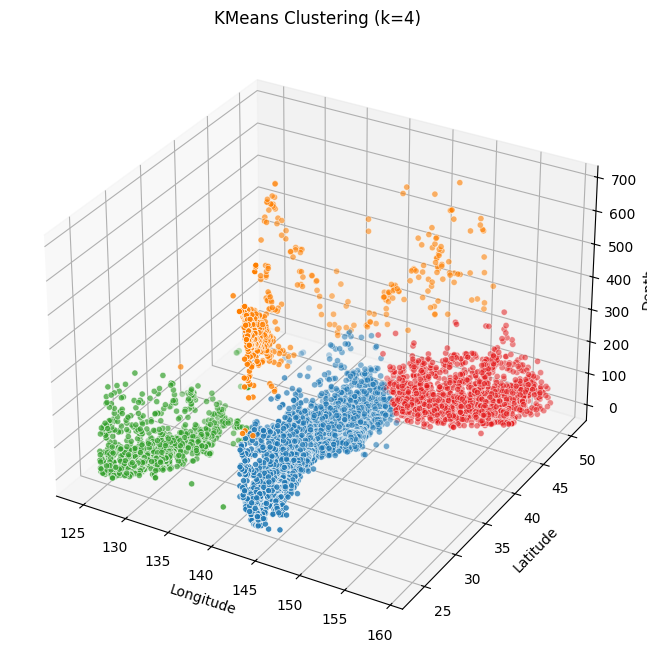

In [97]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors as mcolors

df = pd.read_csv("source.csv")

# Clustering Columns
data_for_cluster = df[['latitude', 'longitude', 'depth']].dropna()

# Standarize
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_for_cluster)

# KMeans
k = 4 # the number of plates
kmeans = KMeans(n_clusters=k, random_state=42)
labels = kmeans.fit_predict(data_scaled)


centroids = pd.DataFrame(kmeans.cluster_centers_, columns=['latitude', 'longitude', 'depth'])
centroids['cluster_id'] = range(k)
print("Cluster Centers (standardized):\n", centroids)

# Add labels
clustered_df = data_for_cluster.copy()
clustered_df['cluster_label'] = labels

print("\nCluster Means:")
print(clustered_df.groupby('cluster_label').mean())


cluster_color_map = {
    0: '#1f78b4',
    1: '#33a02c',
    2: '#e31a1c',
    3: '#ff7f00' 
}

# クラスタラベルに基づいて色を割り当て
color_list = [cluster_color_map[label] for label in labels]

# 2D 可視化（緯度・経度）
plt.figure(figsize=(8, 6))
plt.scatter(
    data_for_cluster['longitude'],
    data_for_cluster['latitude'],
    c=color_list,
    alpha=0.6,
    edgecolors='white',
    linewidths=0.5
)
plt.title(f"KMeans Clustering (k={k})")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# 3D 可視化（緯度・経度・深さ）
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(
    data_for_cluster['longitude'],
    data_for_cluster['latitude'],
    data_for_cluster['depth'],
    c=color_list,
    edgecolors='white',
    linewidths=0.5
)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_zlabel("Depth")
plt.title(f"KMeans Clustering (k={k})")
plt.show()

# **Mapping Major Earthquakes in Japan with Folium**

In [99]:
import folium

# Folium map
m = folium.Map(location=[38, 142], zoom_start=4, tiles='Esri.WorldImagery')

cluster_colors = ['#1f78b4', '#33a02c', '#e31a1c', '#ff7f00']

for _, row in clustered_df.iterrows():
    tooltip = f"""
    <b>Depth:</b> {row['depth']} km<br/>
    <b>Cluster:</b> {row['cluster_label']}
    """
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color='white',
        weight=0.4,
        fill=True,
        fill_color=cluster_colors[int(row['cluster_label'])],
        fill_opacity=0.4,
        tooltip=tooltip
    ).add_to(m)

# Legend
legend_html = '''
<div style="position: fixed; bottom: 30px; left: 30px; width: 180px; height: 140px;
    background-color: white; z-index:9999; font-size:14px;
    border:2px solid grey; padding:10px;">
    <b>Cluster Label</b><br>
    <i style="background:#e31a1c; width:10px; height:10px; display:inline-block;"></i> Cluster 0<br>
    <i style="background:#1f78b4; width:10px; height:10px; display:inline-block;"></i> Cluster 1<br>
    <i style="background:#ff7f00; width:10px; height:10px; display:inline-block;"></i> Cluster 2<br>
    <i style="background:#33a02c; width:10px; height:10px; display:inline-block;"></i> Cluster 3
    
    
</div>
'''
m.get_root().html.add_child(folium.Element(legend_html))
m